In [ ]:
import numpy as np
import gym
from gym import spaces
import matplotlib.pyplot as plt
import matplotlib.patches as patches


# Part I: Define an RL Environment

In [ ]:

class GridWorldEnv(gym.Env):
    metadata = {'render.modes': ['human']}
    
    def __init__(self, nrows=5, ncols=5):
        super(GridWorldEnv, self).__init__()
        self.nrows = nrows
        self.ncols = ncols
        self.grid_shape = (self.nrows, self.ncols)
        # Define action and observation space
        self.action_space = spaces.Discrete(4) # up, down, right, left
        self.observation_space = spaces.Discrete(25) # 5x5 grid
        
        # Define states, actions, rewards
        self.states = [(i, j) for i in range(5) for j in range(5)]
        self.actions = ['Up', 'Right', 'Down', 'Left']
        self.rewards = {'(0, 2)': -6, '(3, 0)': -5, '(1, 3)': 5, '(3, 2)': 6, '(1, 0)': -3,  '(4, 4)': 10}
        self.start_state = (0, 0)
        self.goal_state = (4, 4)
        self.stone =  (3, 0)
        self.small_stone = (1, 0)
        self.garbage = (0, 2)
        self.mega_charger_location = (3, 2)
        self.charger_location = (1, 3)
        self.current_state = self.start_state
        self.done = False
        self.reward_move = 0  # Or whatever value you want to use for the move reward
        self.reward_goal = 10
        self.cummulative_reward = 0
        self.timesteps = 0
        self.max_timesteps = 60
        self.state_reward = 0
        
        
    def step(self, action):

        if action < 0 or action > 3:
            raise ValueError("Invalid action")

        row, col = self.current_state
        
        # Move according to action
        if action == 0:  # up
            row -= 1
        elif action == 1:  # right
            col += 1
        elif action == 2:  # down
            row += 1
        elif action == 3:  # left
            col -= 1
        
        # Check if next_state is within the boundaries of the grid world
        if row < 0 or row >= self.grid_shape[0] or col < 0 or col >= self.grid_shape[1]:
            next_state = self.current_state
        else:
            next_state = (row, col)
        
        # Calculate reward
        if next_state == self.goal_state:
            print('Hurray! lawn mover Found the Goal')
            reward = self.reward_goal
            self.state_reward = self.reward_goal
            
        elif next_state == self.current_state:
            reward = 0
            self.state_reward = 0
            
        elif next_state == self.stone:
            reward = self.rewards[str(next_state)]
            self.state_reward = self.rewards[str(next_state)]

        elif next_state == self.small_stone:
            reward = self.rewards[str(next_state)]
            self.state_reward = self.rewards[str(next_state)]

        elif next_state == self.garbage:
            reward = self.rewards[str(next_state)]
            self.state_reward = self.rewards[str(next_state)]

        elif next_state == self.mega_charger_location:
            reward = self.rewards[str(next_state)]
            self.state_reward = self.rewards[str(next_state)]

        elif next_state == self.charger_location:
            reward = self.rewards[str(next_state)]
            self.state_reward = self.rewards[str(next_state)]

        else:
            reward = self.reward_move
            self.state_reward = self.reward_move

        
        # Update cumulative reward
        self.cummulative_reward += reward
        self.timesteps += 1

        # Calculate reward and check if episode is done
        if next_state == self.goal_state:
            reward = self.reward_goal
            done = True
        elif self.timesteps >= self.max_timesteps:
            done = True
        else:
            reward = self.reward_move
            done = False  
            
        self.current_state = next_state
        return next_state, self.timesteps, self.state_reward, self.cummulative_reward, done, {}
       
    def reset(self):
        # Resets the state of the environment to an initial state
        self.current_state = self.start_state
        self.done = False
        self.cummulative_reward = 0
        self.timesteps = 0
        return self.current_state

    def render(self, mode='human'):
    # Render the environment
        grid = np.zeros(self.grid_shape)
        for i in range(self.nrows):
            for j in range(self.ncols):
                if (i, j) == self.stone:
                    grid[i, j] = 1
                elif (i, j) == self.charger_location:
                    grid[i, j] = 2
                elif (i, j) == self.garbage:
                    grid[i, j] = 3
                elif (i, j) == self.mega_charger_location:
                    grid[i, j] = 4
                elif (i, j) == self.current_state:
                    grid[i, j] = 5
                elif (i, j) == self.goal_state:
                    grid[i, j] = 6
                elif (i, j) == self.small_stone:
                    grid[i, j] = 7
        
    # Define color map
        cmap = plt.get_cmap('Pastel2')
        norm = plt.Normalize(vmin=0, vmax=7)
    
        fig, ax = plt.subplots()
        ax.imshow(grid, cmap=cmap, norm=norm, extent=[0, self.ncols, 0, self.nrows])
    
    # Add grid boxes
        for i in range(self.nrows+1):
            ax.axhline(i, lw=2, color='k', zorder=5)
        for i in range(self.ncols+1):
            ax.axvline(i, lw=2, color='k', zorder=5)
  
    # Add labels to each cell
        for i in range(self.nrows):
            for j in range(self.ncols):
                state_name = f"({i},{j})"
                if (i, j) == self.current_state:
                    label = "current\nstate"
                elif (i, j) == self.charger_location:
                    label = "+5"
                elif (i, j) == self.garbage:
                    label = "-6"
                elif (i, j) == self.mega_charger_location:
                    label = "+6"
                elif (i, j) == self.stone:
                    label = "-5"
                elif (i, j) == self.start_state:
                    label = "start\nstate"
                elif (i, j) == self.goal_state:
                    label = "Goal\n+10 "
                elif (i, j) == self.small_stone:
                    label = "-3"
                else:
                    label = ""
        
                ax.text(j+0.5, self.nrows-i-0.5, label, ha="center", va="center", fontsize=14)
                    
        # Set axis limits
        ax.set_xlim(0, self.ncols)
        ax.set_ylim(0, self.nrows)

    # Remove ticks and labels
        ax.set_xticks([])
        ax.set_yticks([])
    
        plt.show()

In [ ]:
class RandomAgent:
    def __init__(self, env):
        self.env = env
        self.observation_space = env.observation_space
        self.action_space = env.action_space

    def step(self, observation):
        return np.random.choice(self.action_space.n)

Step:  1  , Current state:  (0, 1) , Chosen action:  Right , State Reward 0  , Reward: 0


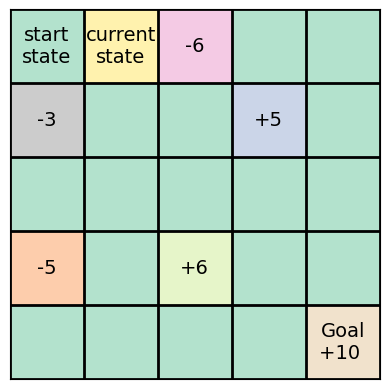

Step:  2  , Current state:  (0, 0) , Chosen action:  Left , State Reward 0  , Reward: 0


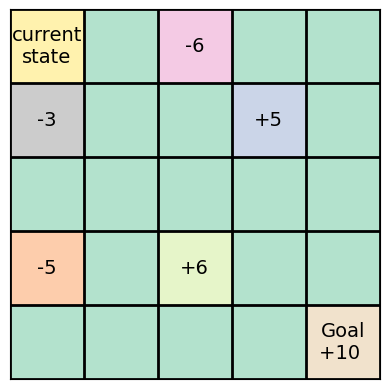

Step:  3  , Current state:  (0, 0) , Chosen action:  Left , State Reward 0  , Reward: 0


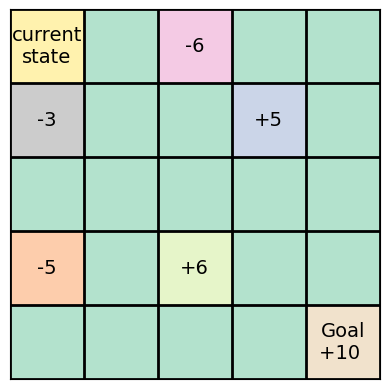

Step:  4  , Current state:  (1, 0) , Chosen action:  Down , State Reward -3  , Reward: -3


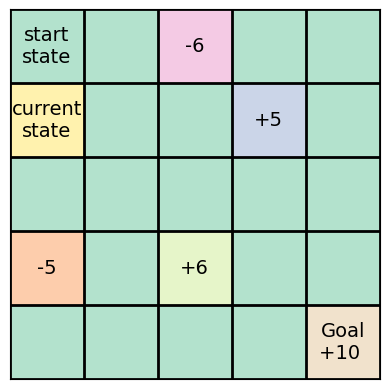

Step:  5  , Current state:  (0, 0) , Chosen action:  Up , State Reward 0  , Reward: -3


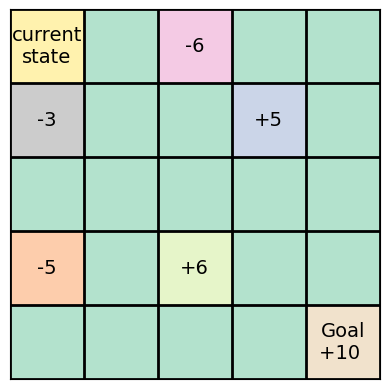

Step:  6  , Current state:  (0, 1) , Chosen action:  Right , State Reward 0  , Reward: -3


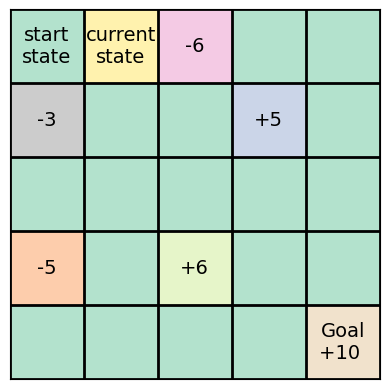

Step:  7  , Current state:  (0, 2) , Chosen action:  Right , State Reward -6  , Reward: -9


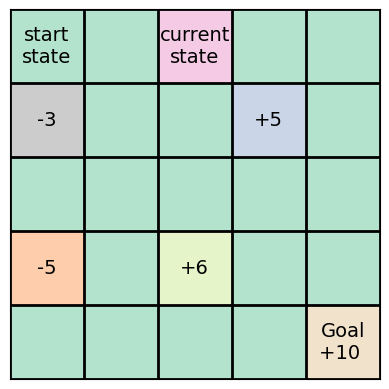

Step:  8  , Current state:  (1, 2) , Chosen action:  Down , State Reward 0  , Reward: -9


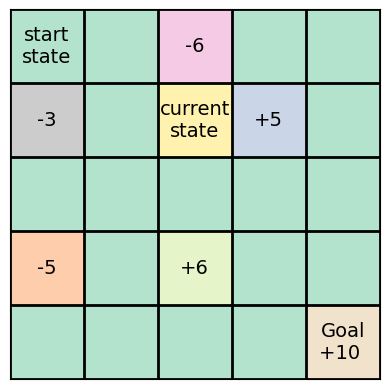

Step:  9  , Current state:  (0, 2) , Chosen action:  Up , State Reward -6  , Reward: -15


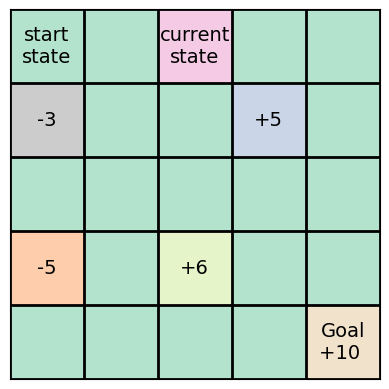

Step:  10  , Current state:  (0, 3) , Chosen action:  Right , State Reward 0  , Reward: -15


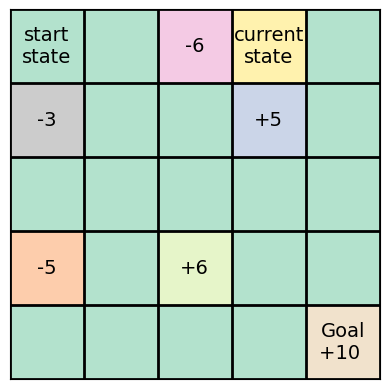

Step:  11  , Current state:  (1, 3) , Chosen action:  Down , State Reward 5  , Reward: -10


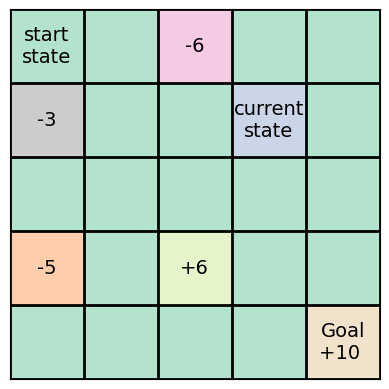

Step:  12  , Current state:  (1, 4) , Chosen action:  Right , State Reward 0  , Reward: -10


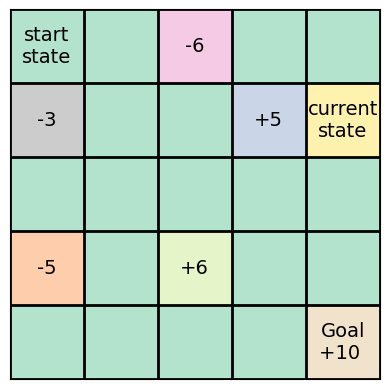

Step:  13  , Current state:  (1, 4) , Chosen action:  Right , State Reward 0  , Reward: -10


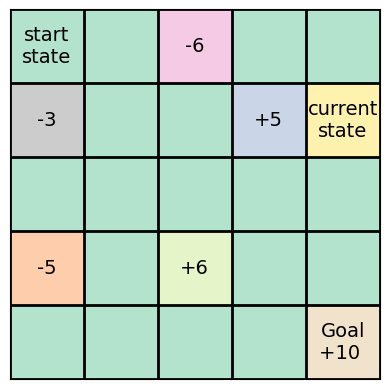

Step:  14  , Current state:  (1, 4) , Chosen action:  Right , State Reward 0  , Reward: -10


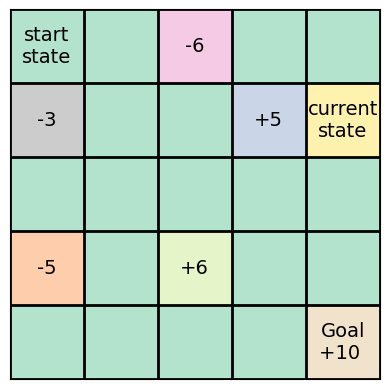

Step:  15  , Current state:  (2, 4) , Chosen action:  Down , State Reward 0  , Reward: -10


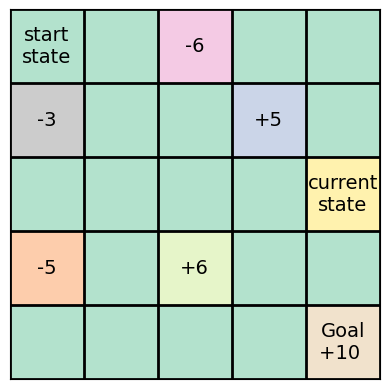

Step:  16  , Current state:  (2, 3) , Chosen action:  Left , State Reward 0  , Reward: -10


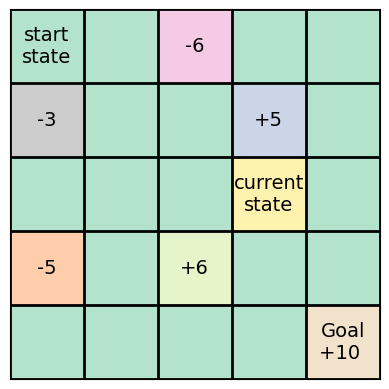

Step:  17  , Current state:  (2, 2) , Chosen action:  Left , State Reward 0  , Reward: -10


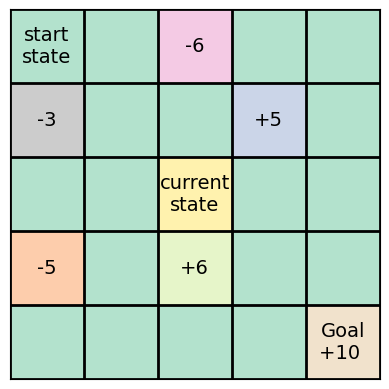

Step:  18  , Current state:  (2, 1) , Chosen action:  Left , State Reward 0  , Reward: -10


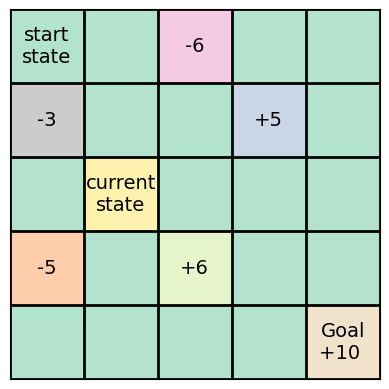

Step:  19  , Current state:  (2, 2) , Chosen action:  Right , State Reward 0  , Reward: -10


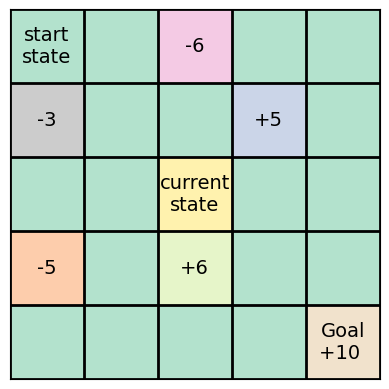

Step:  20  , Current state:  (2, 1) , Chosen action:  Left , State Reward 0  , Reward: -10


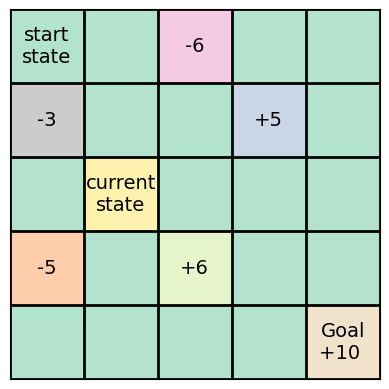

Step:  21  , Current state:  (1, 1) , Chosen action:  Up , State Reward 0  , Reward: -10


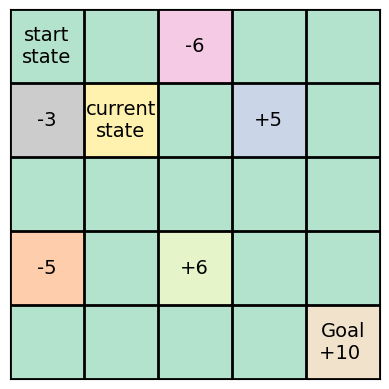

Step:  22  , Current state:  (0, 1) , Chosen action:  Up , State Reward 0  , Reward: -10


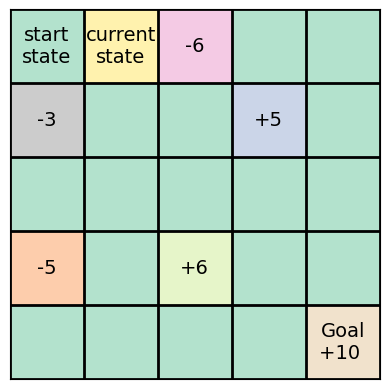

Step:  23  , Current state:  (0, 0) , Chosen action:  Left , State Reward 0  , Reward: -10


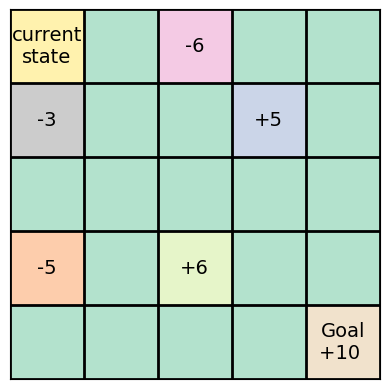

Step:  24  , Current state:  (0, 1) , Chosen action:  Right , State Reward 0  , Reward: -10


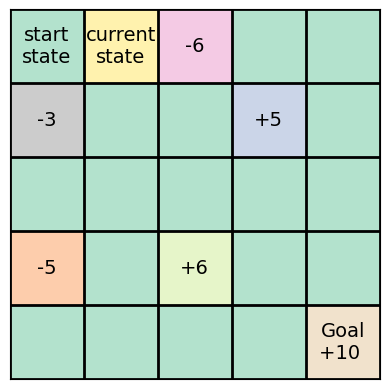

Step:  25  , Current state:  (0, 0) , Chosen action:  Left , State Reward 0  , Reward: -10


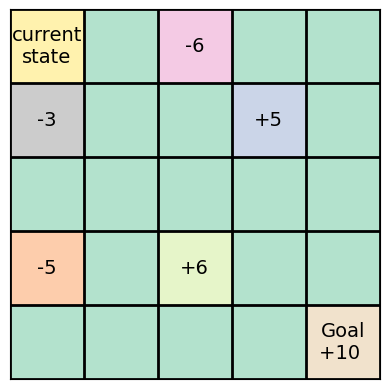

Step:  26  , Current state:  (0, 1) , Chosen action:  Right , State Reward 0  , Reward: -10


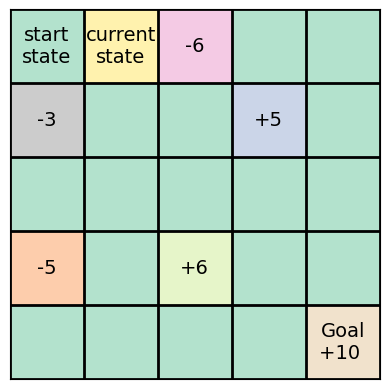

Step:  27  , Current state:  (1, 1) , Chosen action:  Down , State Reward 0  , Reward: -10


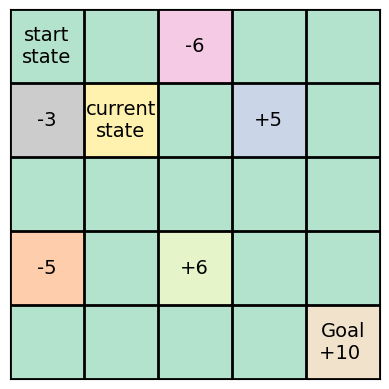

Step:  28  , Current state:  (0, 1) , Chosen action:  Up , State Reward 0  , Reward: -10


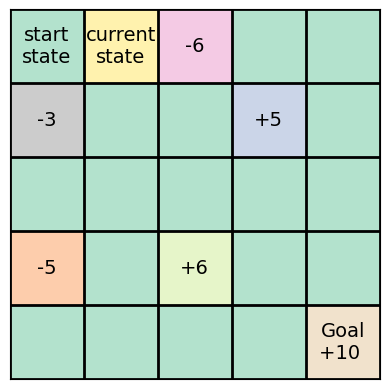

Step:  29  , Current state:  (1, 1) , Chosen action:  Down , State Reward 0  , Reward: -10


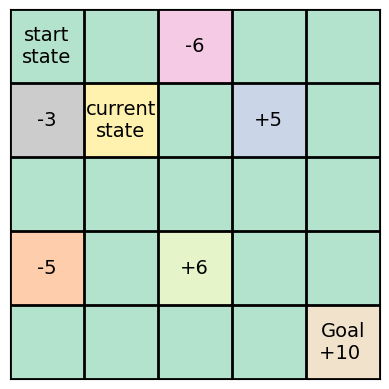

Step:  30  , Current state:  (1, 0) , Chosen action:  Left , State Reward -3  , Reward: -13


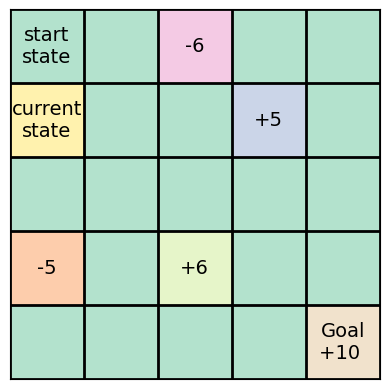

Step:  31  , Current state:  (0, 0) , Chosen action:  Up , State Reward 0  , Reward: -13


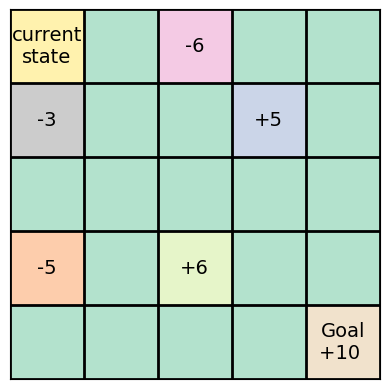

Step:  32  , Current state:  (0, 0) , Chosen action:  Left , State Reward 0  , Reward: -13


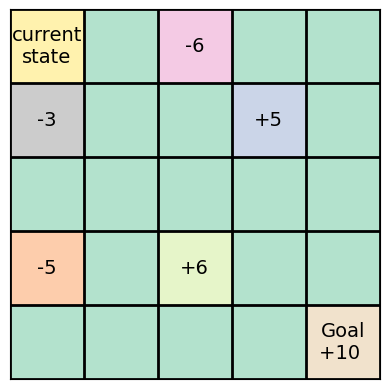

Step:  33  , Current state:  (0, 0) , Chosen action:  Up , State Reward 0  , Reward: -13


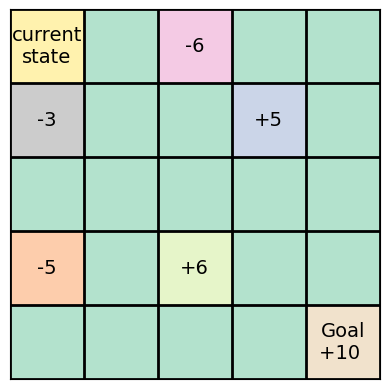

Step:  34  , Current state:  (0, 0) , Chosen action:  Left , State Reward 0  , Reward: -13


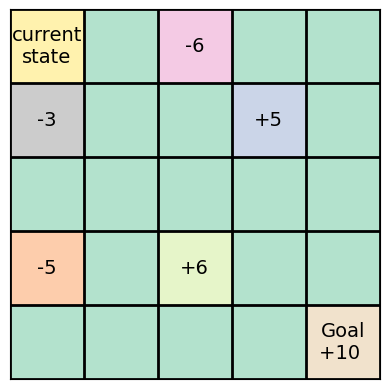

Step:  35  , Current state:  (0, 0) , Chosen action:  Up , State Reward 0  , Reward: -13


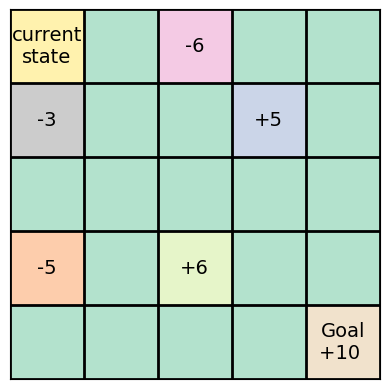

Step:  36  , Current state:  (0, 0) , Chosen action:  Left , State Reward 0  , Reward: -13


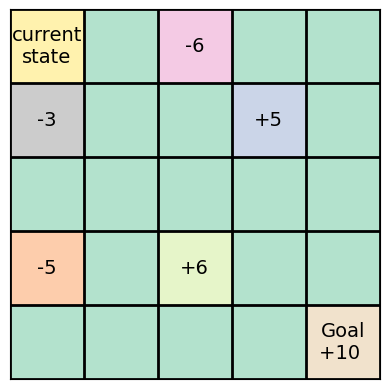

Step:  37  , Current state:  (0, 1) , Chosen action:  Right , State Reward 0  , Reward: -13


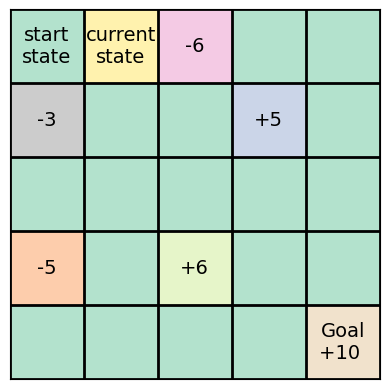

Step:  38  , Current state:  (0, 1) , Chosen action:  Up , State Reward 0  , Reward: -13


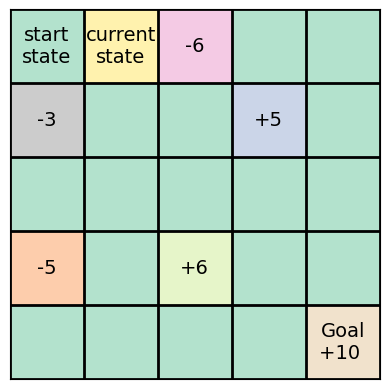

Step:  39  , Current state:  (1, 1) , Chosen action:  Down , State Reward 0  , Reward: -13


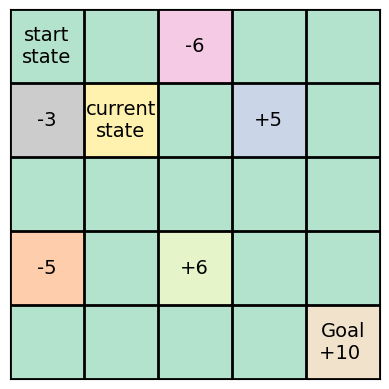

Step:  40  , Current state:  (1, 0) , Chosen action:  Left , State Reward -3  , Reward: -16


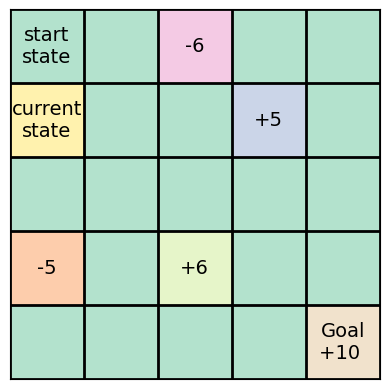

Step:  41  , Current state:  (0, 0) , Chosen action:  Up , State Reward 0  , Reward: -16


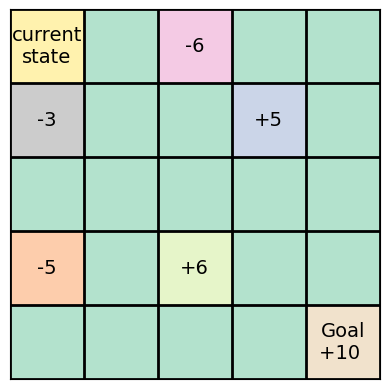

Step:  42  , Current state:  (0, 0) , Chosen action:  Left , State Reward 0  , Reward: -16


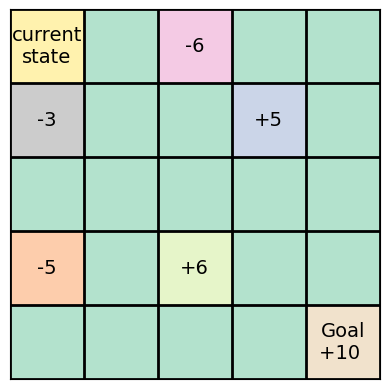

Step:  43  , Current state:  (0, 1) , Chosen action:  Right , State Reward 0  , Reward: -16


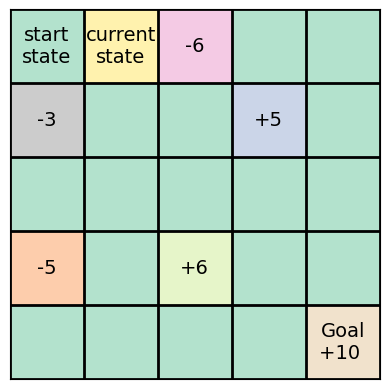

Step:  44  , Current state:  (0, 2) , Chosen action:  Right , State Reward -6  , Reward: -22


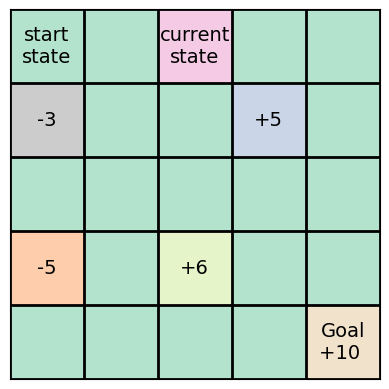

Step:  45  , Current state:  (0, 1) , Chosen action:  Left , State Reward 0  , Reward: -22


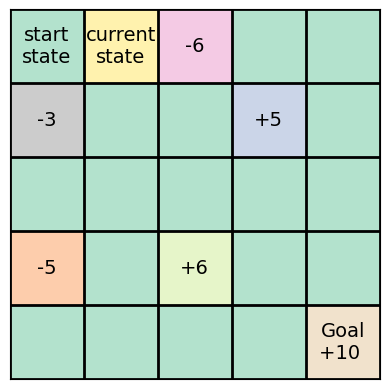

Step:  46  , Current state:  (0, 2) , Chosen action:  Right , State Reward -6  , Reward: -28


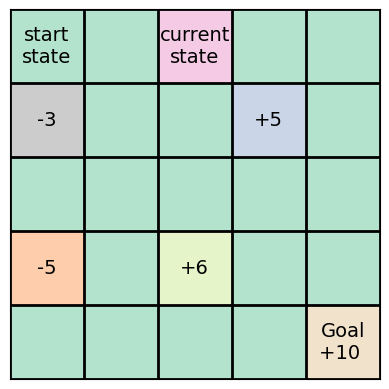

Step:  47  , Current state:  (1, 2) , Chosen action:  Down , State Reward 0  , Reward: -28


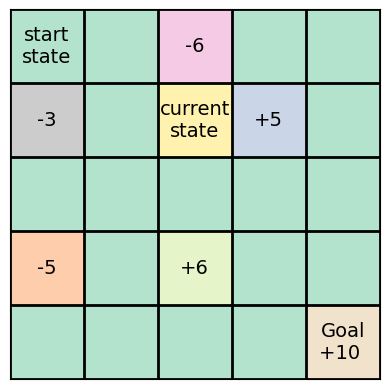

Step:  48  , Current state:  (1, 3) , Chosen action:  Right , State Reward 5  , Reward: -23


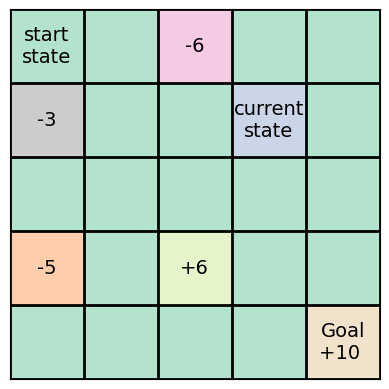

Step:  49  , Current state:  (1, 4) , Chosen action:  Right , State Reward 0  , Reward: -23


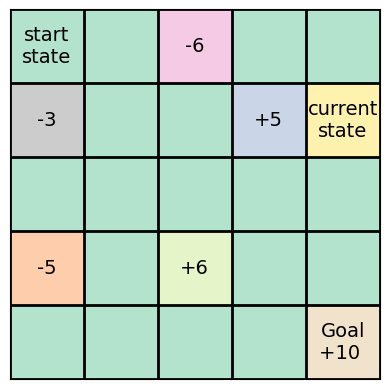

Step:  50  , Current state:  (2, 4) , Chosen action:  Down , State Reward 0  , Reward: -23


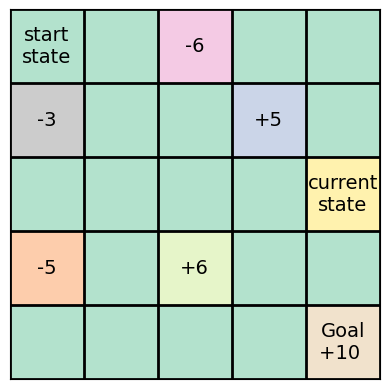

Step:  51  , Current state:  (2, 3) , Chosen action:  Left , State Reward 0  , Reward: -23


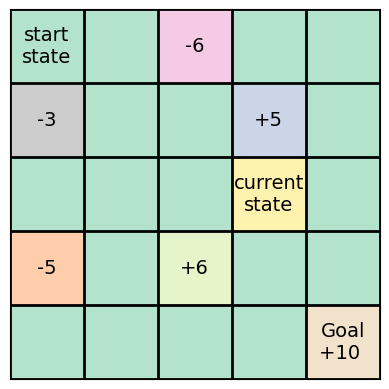

Step:  52  , Current state:  (3, 3) , Chosen action:  Down , State Reward 0  , Reward: -23


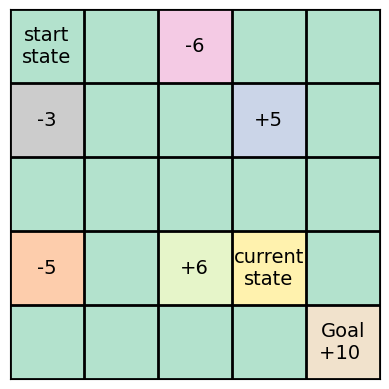

Step:  53  , Current state:  (3, 2) , Chosen action:  Left , State Reward 6  , Reward: -17


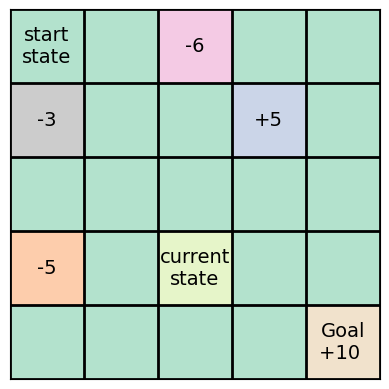

Step:  54  , Current state:  (4, 2) , Chosen action:  Down , State Reward 0  , Reward: -17


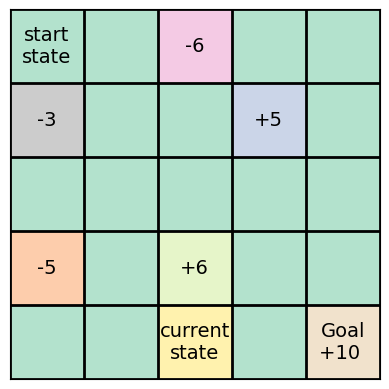

Step:  55  , Current state:  (4, 1) , Chosen action:  Left , State Reward 0  , Reward: -17


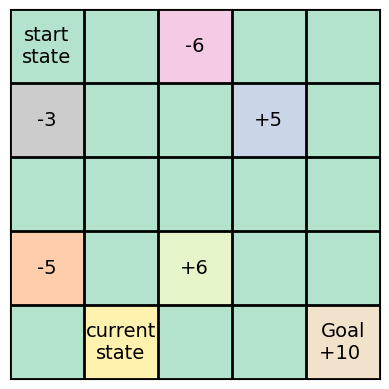

Step:  56  , Current state:  (4, 0) , Chosen action:  Left , State Reward 0  , Reward: -17


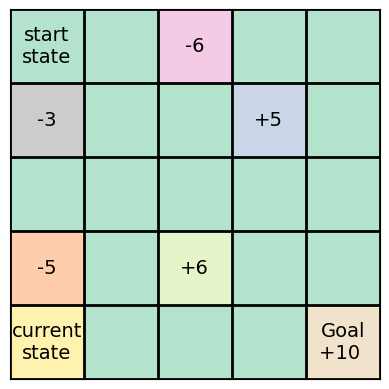

Step:  57  , Current state:  (3, 0) , Chosen action:  Up , State Reward -5  , Reward: -22


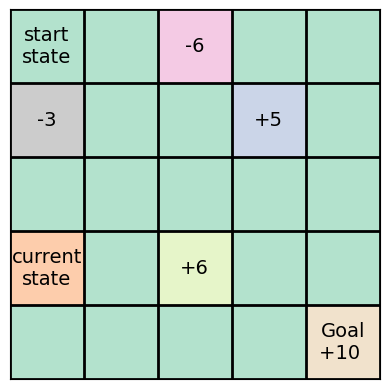

Step:  58  , Current state:  (3, 1) , Chosen action:  Right , State Reward 0  , Reward: -22


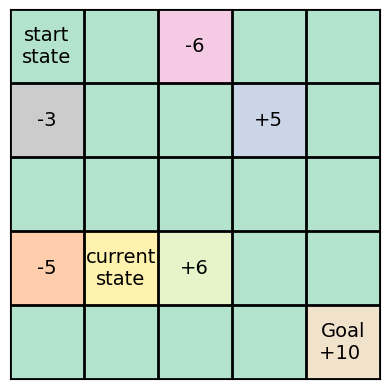

Step:  59  , Current state:  (4, 1) , Chosen action:  Down , State Reward 0  , Reward: -22


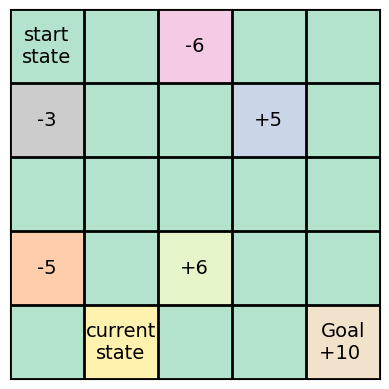

Step:  60  , Current state:  (4, 0) , Chosen action:  Left , State Reward 0  , Reward: -22


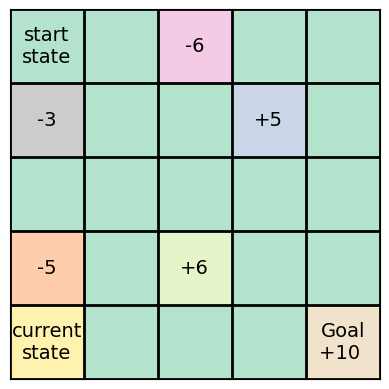

In [ ]:
env = GridWorldEnv()
agent = RandomAgent(env)
obs = env.reset()

done = False
# possible_action = {0:'Up', 1:'Right', 2:'Down', 3:'Left'}
while not done:
    action = agent.step(obs)
    state, timesteps, state_reward, cummulative_reward, done, info = env.step(action)
    print("Step: ", timesteps, " , Current state: ", state, ", Chosen action: ", env.actions[action], ", State Reward", state_reward , " , Reward:", cummulative_reward)
    env.render()
  

# Part II: Solve environment using – SARSA

In [ ]:
class SarsaAgent:
  def __init__(self, env, alpha, gamma, epsilon, epsilon_decay_rate):
    self.env = env
    self.observation_space = env.observation_space
    self.action_space = env.action_space
    self.alpha = alpha
    self.gamma = gamma
    self.epsilon = epsilon
    self.epsilon_decay_rate = epsilon_decay_rate
    self.max_iteration = 200
    self.q_table = np.random.rand(self.observation_space.n, self.action_space.n)
    self.ind = {}
    z= 0
    for i in range(self.env.nrows): 
          for j in range(self.env.ncols):
            self.ind[(i,j)] = z
            z += 1
        

  def choose_action(self, state, episode):
    decayed_epsilon = self.epsilon * (1 / (1 + (self.epsilon_decay_rate * episode)))
    if np.random.uniform(0, 1) < decayed_epsilon:
      # choose random action
      return np.random.choice(self.action_space.n)
    else:
      # choose greedy action
      return np.argmax(self.q_table[self.ind[state], :])

  def sarsa_step(self, state, episode):
    action = self.choose_action(state, episode)
    next_state, timesteps, state_reward, reward, done, info = self.env.step(action)
    next_action = self.choose_action(next_state, episode)
    td_error = (reward + (self.gamma * self.q_table[self.ind[next_state], next_action])) - self.q_table[self.ind[state], action]
    self.q_table[self.ind[state], action] += self.alpha * td_error
    return next_state, action, state_reward, reward, done, info




  def sarsa_train(self, num_episodes): 
    rewards = []
    for episode in range(num_episodes):
      # self.env.render()

      iterations = 0
      total_reward = 0
    
      state = self.env.reset()
      # print('state----' , state)
      while iterations < self.max_iteration :
        state, action, state_reward, reward, done, info = self.sarsa_step(state, episode)
        print("Step: ", iterations + 1, " , Current state: ", state, ", Chosen action: ", action, ", State Reward", state_reward , " , Reward:", reward)
        total_reward += reward
        iterations += 1
        if done:
          break
      print("*****************************************************************************************************************************************")
      rewards.append(total_reward)
    return rewards

In [ ]:
env = GridWorldEnv()
alpha = 0.1
gamma = 0.9
epsilon = 0.1
num_episodes = 100
epsilon_decay_rate = 0.01
agent = SarsaAgent(env, alpha, gamma, epsilon, epsilon_decay_rate)
rewards = agent.sarsa_train(num_episodes)

Streaming output truncated to the last 5000 lines.
Step:  57  , Current state:  (1, 4) , Chosen action:  1 , State Reward 0  , Reward: 7
Step:  58  , Current state:  (1, 4) , Chosen action:  1 , State Reward 0  , Reward: 7
Step:  59  , Current state:  (1, 4) , Chosen action:  1 , State Reward 0  , Reward: 7
Step:  60  , Current state:  (1, 4) , Chosen action:  1 , State Reward 0  , Reward: 7
*****************************************************************************************************************************************
Step:  1  , Current state:  (0, 1) , Chosen action:  1 , State Reward 0  , Reward: 0
Step:  2  , Current state:  (1, 1) , Chosen action:  2 , State Reward 0  , Reward: 0
Step:  3  , Current state:  (1, 2) , Chosen action:  1 , State Reward 0  , Reward: 0
Step:  4  , Current state:  (1, 3) , Chosen action:  1 , State Reward 5  , Reward: 5
Step:  5  , Current state:  (1, 4) , Chosen action:  1 , State Reward 0  , Reward: 5
Step:  6  , Current state:  (1, 4) , Chose

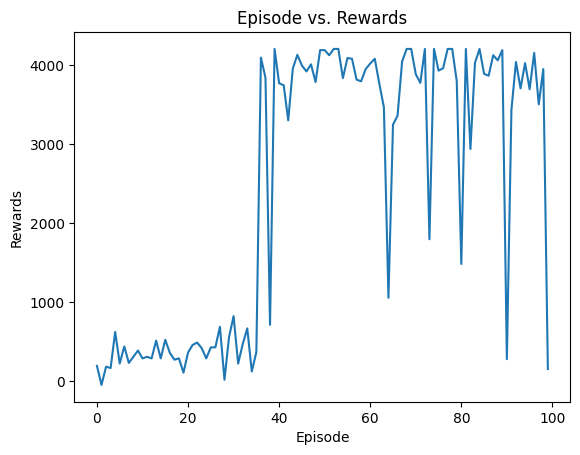

In [ ]:
plt.plot(rewards)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

# Hyperparameter Tuning

## Discount factor (γ) 

In [ ]:
alpha = 0.2
gamma2 = 0.8
epsilon_gamma2 = 0.1
num_episodes = 100
epsilon_decay_rate_gamma2 = 0.01
agent_gamma2 = SarsaAgent(env, alpha, gamma2, epsilon_gamma2, epsilon_decay_rate_gamma2)
rewards_gamma2 = agent_gamma2.sarsa_train(num_episodes)

Streaming output truncated to the last 5000 lines.
Step:  46  , Current state:  (2, 2) , Chosen action:  1 , State Reward 0  , Reward: 51
Step:  47  , Current state:  (3, 2) , Chosen action:  2 , State Reward 6  , Reward: 57
Step:  48  , Current state:  (3, 1) , Chosen action:  3 , State Reward 0  , Reward: 57
Step:  49  , Current state:  (3, 2) , Chosen action:  1 , State Reward 6  , Reward: 63
Step:  50  , Current state:  (3, 1) , Chosen action:  3 , State Reward 0  , Reward: 63
Step:  51  , Current state:  (2, 1) , Chosen action:  0 , State Reward 0  , Reward: 63
Step:  52  , Current state:  (2, 2) , Chosen action:  1 , State Reward 0  , Reward: 63
Step:  53  , Current state:  (3, 2) , Chosen action:  2 , State Reward 6  , Reward: 69
Step:  54  , Current state:  (3, 3) , Chosen action:  1 , State Reward 0  , Reward: 69
Step:  55  , Current state:  (4, 3) , Chosen action:  2 , State Reward 0  , Reward: 69
Step:  56  , Current state:  (3, 3) , Chosen action:  0 , State Reward 0  , Rew

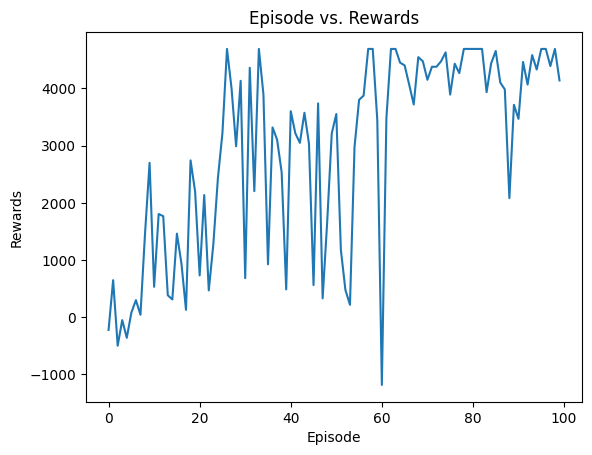

In [ ]:
plt.plot(rewards_gamma2)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

In [ ]:
alpha = 0.2
gamma3 = 0.95
epsilon_gamma3 = 0.1
num_episodes_gamma3 = 100
epsilon_decay_rate_gamma3 = 0.01
agent_gamma3 = SarsaAgent(env, alpha, gamma3, epsilon_gamma3, epsilon_decay_rate_gamma3)
rewards_gamma3 = agent_gamma3.sarsa_train(num_episodes)

Streaming output truncated to the last 5000 lines.
Step:  3  , Current state:  (0, 1) , Chosen action:  0 , State Reward 0  , Reward: 0
Step:  4  , Current state:  (1, 1) , Chosen action:  2 , State Reward 0  , Reward: 0
Step:  5  , Current state:  (1, 2) , Chosen action:  1 , State Reward 0  , Reward: 0
Step:  6  , Current state:  (2, 2) , Chosen action:  2 , State Reward 0  , Reward: 0
Step:  7  , Current state:  (3, 2) , Chosen action:  2 , State Reward 6  , Reward: 6
Step:  8  , Current state:  (2, 2) , Chosen action:  0 , State Reward 0  , Reward: 6
Step:  9  , Current state:  (3, 2) , Chosen action:  2 , State Reward 6  , Reward: 12
Step:  10  , Current state:  (2, 2) , Chosen action:  0 , State Reward 0  , Reward: 12
Step:  11  , Current state:  (3, 2) , Chosen action:  2 , State Reward 6  , Reward: 18
Step:  12  , Current state:  (2, 2) , Chosen action:  0 , State Reward 0  , Reward: 18
Step:  13  , Current state:  (3, 2) , Chosen action:  2 , State Reward 6  , Reward: 24
Step:

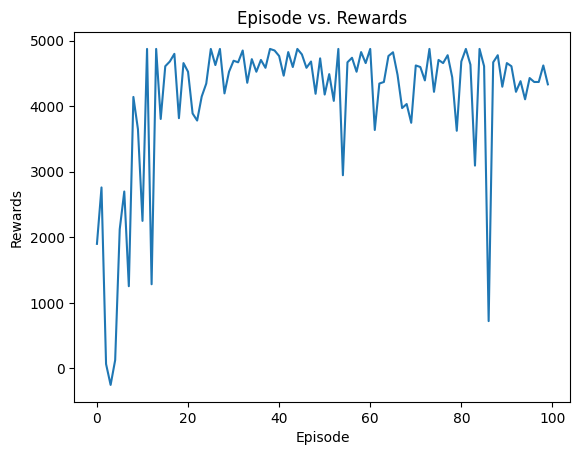

In [ ]:
plt.plot(rewards_gamma3)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

## Epsilon values 

In [ ]:
alpha = 0.2
gamma = 0.95
epsilon2 = 0.9
num_episodes = 100
epsilon_decay_rate = 0.01
agent_e2 = SarsaAgent(env, alpha, gamma, epsilon2, epsilon_decay_rate)
rewards_e2 = agent.sarsa_train(num_episodes)

Streaming output truncated to the last 5000 lines.
Step:  33  , Current state:  (1, 3) , Chosen action:  3 , State Reward 5  , Reward: 75
Step:  34  , Current state:  (1, 4) , Chosen action:  1 , State Reward 0  , Reward: 75
Step:  35  , Current state:  (1, 3) , Chosen action:  3 , State Reward 5  , Reward: 80
Step:  36  , Current state:  (1, 4) , Chosen action:  1 , State Reward 0  , Reward: 80
Step:  37  , Current state:  (1, 3) , Chosen action:  3 , State Reward 5  , Reward: 85
Step:  38  , Current state:  (1, 4) , Chosen action:  1 , State Reward 0  , Reward: 85
Step:  39  , Current state:  (1, 3) , Chosen action:  3 , State Reward 5  , Reward: 90
Step:  40  , Current state:  (0, 3) , Chosen action:  0 , State Reward 0  , Reward: 90
Step:  41  , Current state:  (1, 3) , Chosen action:  2 , State Reward 5  , Reward: 95
Step:  42  , Current state:  (1, 4) , Chosen action:  1 , State Reward 0  , Reward: 95
Step:  43  , Current state:  (1, 3) , Chosen action:  3 , State Reward 5  , Rew

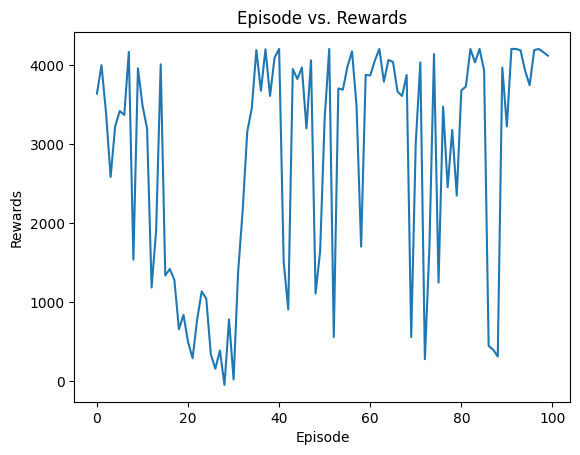

In [ ]:
plt.plot(rewards_e2)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

In [ ]:
epsilon3 = 0.99
agent_e3 = SarsaAgent(env, alpha, gamma, epsilon3, epsilon_decay_rate)
rewards_e3 = agent_e3.sarsa_train(num_episodes)

Streaming output truncated to the last 5000 lines.
Step:  43  , Current state:  (4, 3) , Chosen action:  1 , State Reward 0  , Reward: -20
Step:  44  , Current state:  (4, 2) , Chosen action:  3 , State Reward 0  , Reward: -20
Step:  45  , Current state:  (4, 3) , Chosen action:  1 , State Reward 0  , Reward: -20
Step:  46  , Current state:  (3, 3) , Chosen action:  0 , State Reward 0  , Reward: -20
Step:  47  , Current state:  (3, 2) , Chosen action:  3 , State Reward 6  , Reward: -14
Step:  48  , Current state:  (3, 1) , Chosen action:  3 , State Reward 0  , Reward: -14
Step:  49  , Current state:  (3, 0) , Chosen action:  3 , State Reward -5  , Reward: -19
Step:  50  , Current state:  (3, 0) , Chosen action:  3 , State Reward 0  , Reward: -19
Step:  51  , Current state:  (2, 0) , Chosen action:  0 , State Reward 0  , Reward: -19
Step:  52  , Current state:  (2, 0) , Chosen action:  3 , State Reward 0  , Reward: -19
Step:  53  , Current state:  (2, 0) , Chosen action:  3 , State Rewa

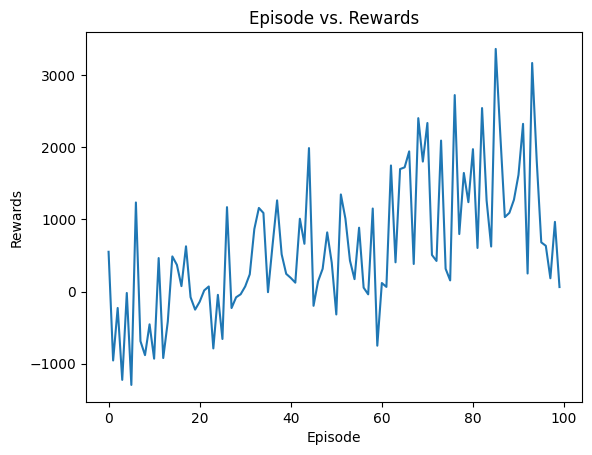

In [ ]:
plt.plot(rewards_e3)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

## Epsilon decay rate 

In [ ]:
epsilon_decay_rate2 = 0.08
agent_ed2 = SarsaAgent(env, alpha, gamma, epsilon, epsilon_decay_rate2)
rewards_ed2 = agent_ed2.sarsa_train(num_episodes)

Streaming output truncated to the last 5000 lines.
Step:  49  , Current state:  (3, 3) , Chosen action:  1 , State Reward 0  , Reward: 51
Step:  50  , Current state:  (3, 2) , Chosen action:  3 , State Reward 6  , Reward: 57
Step:  51  , Current state:  (3, 3) , Chosen action:  1 , State Reward 0  , Reward: 57
Step:  52  , Current state:  (3, 2) , Chosen action:  3 , State Reward 6  , Reward: 63
Step:  53  , Current state:  (3, 3) , Chosen action:  1 , State Reward 0  , Reward: 63
Step:  54  , Current state:  (3, 2) , Chosen action:  3 , State Reward 6  , Reward: 69
Step:  55  , Current state:  (3, 3) , Chosen action:  1 , State Reward 0  , Reward: 69
Step:  56  , Current state:  (3, 2) , Chosen action:  3 , State Reward 6  , Reward: 75
Step:  57  , Current state:  (3, 3) , Chosen action:  1 , State Reward 0  , Reward: 75
Step:  58  , Current state:  (3, 2) , Chosen action:  3 , State Reward 6  , Reward: 81
Step:  59  , Current state:  (3, 3) , Chosen action:  1 , State Reward 0  , Rew

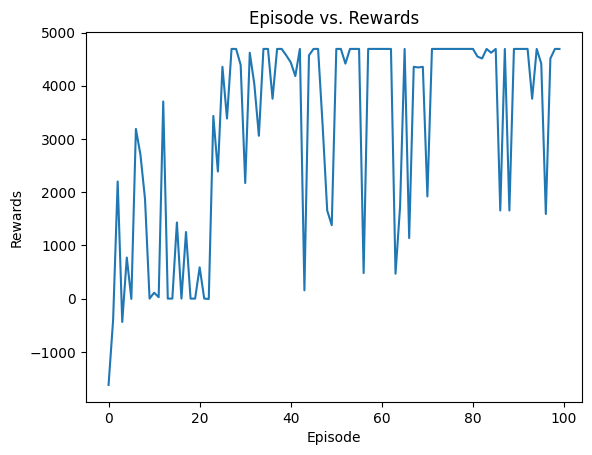

In [ ]:
plt.plot(rewards_ed2)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

In [ ]:
epsilon_decay_rate3 = 0.03
agent_ed3 = SarsaAgent(env, alpha, gamma, epsilon, epsilon_decay_rate3)
rewards_ed3 = agent_ed3.sarsa_train(num_episodes)

Streaming output truncated to the last 5000 lines.
Step:  3  , Current state:  (1, 2) , Chosen action:  1 , State Reward 0  , Reward: 0
Step:  4  , Current state:  (1, 3) , Chosen action:  1 , State Reward 5  , Reward: 5
Step:  5  , Current state:  (1, 4) , Chosen action:  1 , State Reward 0  , Reward: 5
Step:  6  , Current state:  (1, 3) , Chosen action:  3 , State Reward 5  , Reward: 10
Step:  7  , Current state:  (1, 4) , Chosen action:  1 , State Reward 0  , Reward: 10
Step:  8  , Current state:  (1, 3) , Chosen action:  3 , State Reward 5  , Reward: 15
Step:  9  , Current state:  (1, 4) , Chosen action:  1 , State Reward 0  , Reward: 15
Step:  10  , Current state:  (1, 3) , Chosen action:  3 , State Reward 5  , Reward: 20
Step:  11  , Current state:  (1, 4) , Chosen action:  1 , State Reward 0  , Reward: 20
Step:  12  , Current state:  (1, 3) , Chosen action:  3 , State Reward 5  , Reward: 25
Step:  13  , Current state:  (1, 4) , Chosen action:  1 , State Reward 0  , Reward: 25
St

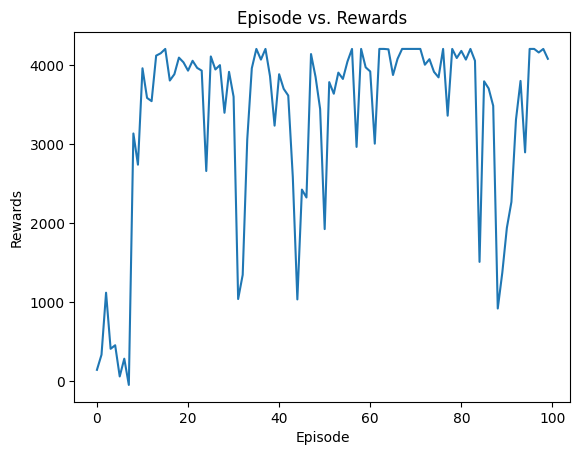

In [ ]:
plt.plot(rewards_ed3)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

## Epsilon decay Vs Rewards per episode

In [ ]:
epsilon_decay_list = [0.9, 0.6, 0.3, 0.1, 0.05, 0.02]
final = []
for i in range(len(epsilon_decay_list)):
    agent_list= SarsaAgent(env, alpha, gamma, epsilon, epsilon_decay_list[i])
    rewards_list = agent_list.sarsa_train(num_episodes)
    final_reward = final.append(rewards_list)

Streaming output truncated to the last 5000 lines.
Step:  3  , Current state:  (2, 1) , Chosen action:  2 , State Reward 0  , Reward: 0
Step:  4  , Current state:  (2, 2) , Chosen action:  1 , State Reward 0  , Reward: 0
Step:  5  , Current state:  (3, 2) , Chosen action:  2 , State Reward 6  , Reward: 6
Step:  6  , Current state:  (3, 1) , Chosen action:  3 , State Reward 0  , Reward: 6
Step:  7  , Current state:  (4, 1) , Chosen action:  2 , State Reward 0  , Reward: 6
Step:  8  , Current state:  (4, 1) , Chosen action:  2 , State Reward 0  , Reward: 6
Step:  9  , Current state:  (4, 1) , Chosen action:  2 , State Reward 0  , Reward: 6
Step:  10  , Current state:  (4, 2) , Chosen action:  1 , State Reward 0  , Reward: 6
Step:  11  , Current state:  (3, 2) , Chosen action:  0 , State Reward 6  , Reward: 12
Step:  12  , Current state:  (3, 1) , Chosen action:  3 , State Reward 0  , Reward: 12
Step:  13  , Current state:  (3, 2) , Chosen action:  1 , State Reward 6  , Reward: 18
Step:  

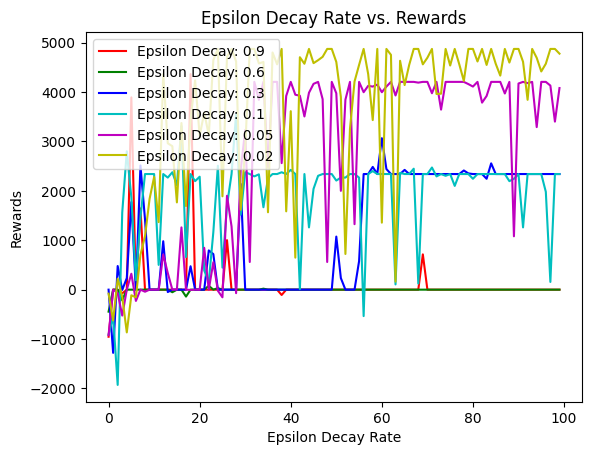

In [ ]:
colors = ['r', 'g', 'b', 'c', 'm', 'y']
# Plot the rewards for each epsilon_decay value with different color lines
for i in range(len(epsilon_decay_list)):
    plt.plot(final[i], colors[i], label='Epsilon Decay: {}'.format(epsilon_decay_list[i]))

plt.xlabel('Epsilon Decay Rate')
plt.ylabel('Rewards')
plt.title('Epsilon Decay Rate vs. Rewards')
plt.legend()
plt.show()

# Part III: Solve environment using Qlearning

In [ ]:
class QLearningAgent:
  def __init__(self, env, alpha, gamma, epsilon, epsilon_decay_rate):
    self.env = env
    self.observation_space = env.observation_space
    self.action_space = env.action_space
    self.alpha = alpha
    self.gamma = gamma
    self.epsilon = epsilon
    self.epsilon_decay_rate = epsilon_decay_rate
    self.max_iteration = 200
    self.q_table = np.random.rand(self.observation_space.n, self.action_space.n)
    self.ind = {}
    z= 0
    for i in range(self.env.nrows): 
          for j in range(self.env.ncols):
            self.ind[(i,j)] = z
            z += 1
        

  def choose_action(self, state, episode):
    decayed_epsilon = self.epsilon * (1 / (1 + (self.epsilon_decay_rate * episode)))
    if np.random.uniform(0, 1) < decayed_epsilon:
      # choose random action
      return np.random.choice(self.action_space.n)
    else:
      # choose greedy action
      return np.argmax(self.q_table[self.ind[state], :])

  def q_learning_step(self, state, episode):
    action = self.choose_action(state, episode)
    next_state, timesteps, state_reward, reward, done, info = self.env.step(action)
    next_action = np.argmax(self.q_table[self.ind[next_state], :])
    td_error = (reward + (self.gamma * self.q_table[self.ind[next_state], next_action])) - self.q_table[self.ind[state], action]
    self.q_table[self.ind[state], action] += self.alpha * td_error
    return next_state, action, state_reward, reward, done, info

  def q_learning_train(self, num_episodes):
    rewards = []
    for episode in range(num_episodes):
      # self.env.render()
    
      iterations = 0
      total_reward = 0
    
      state = self.env.reset()
      # print('state----' , state)
      while iterations < self.max_iteration :
        state, action, state_reward, reward, done, info = self.q_learning_step(state, episode)
        print("Step: ", iterations + 1, " , Current state: ", state, ", Chosen action: ", action, ", State Reward", state_reward , " , Reward:", reward)
        total_reward += reward
        iterations += 1
        if done:
          break
      print("*****************************************************************************************************************************************")
      rewards.append(total_reward)
    return rewards


In [ ]:
env = GridWorldEnv()
alpha = 0.2
gamma = 0.9
epsilon = 0.1
num_episodes = 100
epsilon_decay_rate = 0.01
agent = QLearningAgent(env, alpha, gamma, epsilon, epsilon_decay_rate)
rewards = agent.q_learning_train(num_episodes)

Streaming output truncated to the last 5000 lines.
Step:  3  , Current state:  (1, 2) , Chosen action:  1 , State Reward 0  , Reward: 0
Step:  4  , Current state:  (1, 3) , Chosen action:  1 , State Reward 5  , Reward: 5
Step:  5  , Current state:  (2, 3) , Chosen action:  2 , State Reward 0  , Reward: 5
Step:  6  , Current state:  (2, 4) , Chosen action:  1 , State Reward 0  , Reward: 5
Step:  7  , Current state:  (2, 3) , Chosen action:  3 , State Reward 0  , Reward: 5
Step:  8  , Current state:  (2, 4) , Chosen action:  1 , State Reward 0  , Reward: 5
Step:  9  , Current state:  (2, 3) , Chosen action:  3 , State Reward 0  , Reward: 5
Step:  10  , Current state:  (2, 4) , Chosen action:  1 , State Reward 0  , Reward: 5
Step:  11  , Current state:  (2, 3) , Chosen action:  3 , State Reward 0  , Reward: 5
Step:  12  , Current state:  (2, 4) , Chosen action:  1 , State Reward 0  , Reward: 5
Step:  13  , Current state:  (2, 3) , Chosen action:  3 , State Reward 0  , Reward: 5
Step:  14 

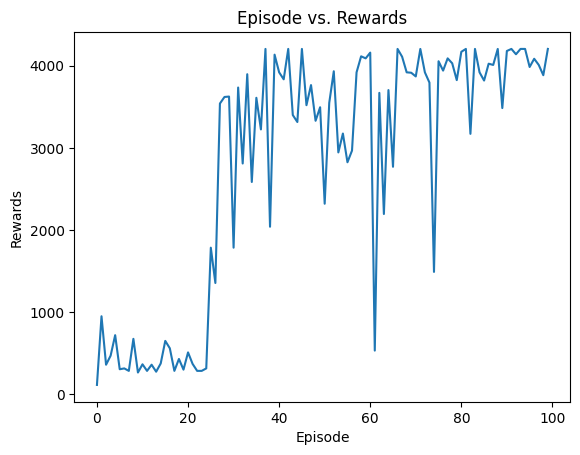

In [ ]:
plt.plot(rewards)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

## Hyperparameter Tuning

### Discount factor (γ)

In [ ]:
env = GridWorldEnv()
alpha = 0.2
gamma2 = 0.85
epsilon = 0.1
num_episodes = 100
epsilon_decay_rate = 0.01
agent2 = QLearningAgent(env, alpha, gamma2, epsilon, epsilon_decay_rate)
rewards2 = agent2.q_learning_train(num_episodes)

Step:  1  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  2  , Current state:  (0, 1) , Chosen action:  1 , State Reward 0  , Reward: 0
Step:  3  , Current state:  (0, 2) , Chosen action:  1 , State Reward -6  , Reward: -6
Step:  4  , Current state:  (1, 2) , Chosen action:  2 , State Reward 0  , Reward: -6
Step:  5  , Current state:  (1, 1) , Chosen action:  3 , State Reward 0  , Reward: -6
Step:  6  , Current state:  (1, 0) , Chosen action:  3 , State Reward -3  , Reward: -9
Step:  7  , Current state:  (0, 0) , Chosen action:  0 , State Reward 0  , Reward: -9
Step:  8  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: -9
Step:  9  , Current state:  (0, 1) , Chosen action:  1 , State Reward 0  , Reward: -9
Step:  10  , Current state:  (1, 1) , Chosen action:  2 , State Reward 0  , Reward: -9
Step:  11  , Current state:  (0, 1) , Chosen action:  0 , State Reward 0  , Reward: -9
Step:  12  , Current state:  (0, 0) , Chosen action:

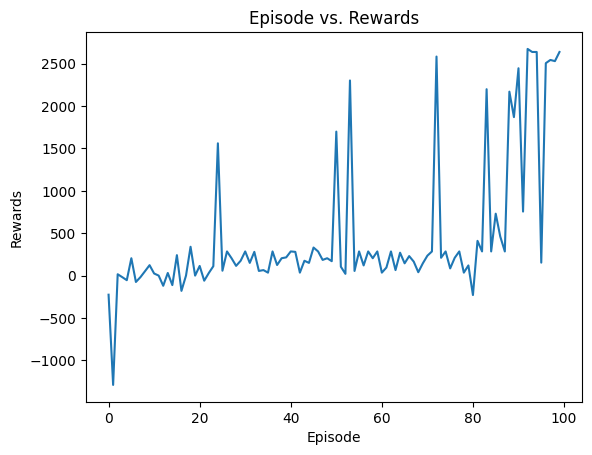

In [ ]:
plt.plot(rewards2)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

In [ ]:
alpha = 0.2
gamma3 = 0.95
epsilon = 0.1
num_episodes = 50
epsilon_decay_rate = 0.01
agent_gamma3 = QLearningAgent(env, alpha, gamma3, epsilon, epsilon_decay_rate)
rewards_gamma3 = agent_gamma3.q_learning_train(num_episodes)

Step:  1  , Current state:  (1, 0) , Chosen action:  2 , State Reward -3  , Reward: -3
Step:  2  , Current state:  (1, 1) , Chosen action:  1 , State Reward 0  , Reward: -3
Step:  3  , Current state:  (2, 1) , Chosen action:  2 , State Reward 0  , Reward: -3
Step:  4  , Current state:  (2, 2) , Chosen action:  1 , State Reward 0  , Reward: -3
Step:  5  , Current state:  (1, 2) , Chosen action:  0 , State Reward 0  , Reward: -3
Step:  6  , Current state:  (2, 2) , Chosen action:  2 , State Reward 0  , Reward: -3
Step:  7  , Current state:  (2, 1) , Chosen action:  3 , State Reward 0  , Reward: -3
Step:  8  , Current state:  (2, 0) , Chosen action:  3 , State Reward 0  , Reward: -3
Step:  9  , Current state:  (1, 0) , Chosen action:  0 , State Reward -3  , Reward: -6
Step:  10  , Current state:  (2, 0) , Chosen action:  2 , State Reward 0  , Reward: -6
Step:  11  , Current state:  (2, 0) , Chosen action:  3 , State Reward 0  , Reward: -6
Step:  12  , Current state:  (2, 0) , Chosen actio

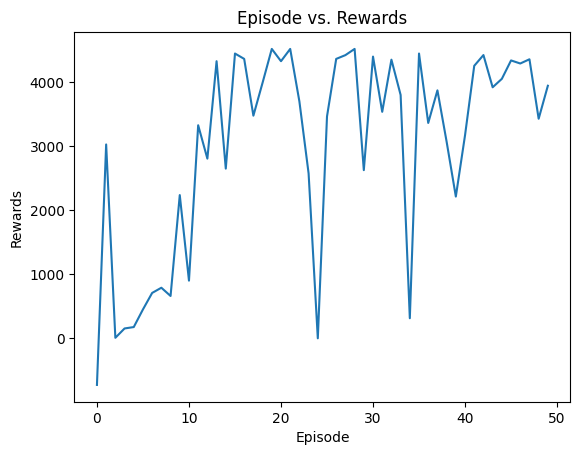

In [ ]:
plt.plot(rewards_gamma3)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

In [47]:
alpha = 0.2
gamma4 = 0.88
epsilon = 0.1
num_episodes = 100
epsilon_decay_rate = 0.01
agent_gamma4 = QLearningAgent(env, alpha, gamma4, epsilon, epsilon_decay_rate)
rewards_gamma4 = agent_gamma4.q_learning_train(num_episodes)

Streaming output truncated to the last 5000 lines.
Step:  3  , Current state:  (1, 0) , Chosen action:  2 , State Reward -3  , Reward: -6
Step:  4  , Current state:  (1, 1) , Chosen action:  1 , State Reward 0  , Reward: -6
Step:  5  , Current state:  (1, 2) , Chosen action:  1 , State Reward 0  , Reward: -6
Step:  6  , Current state:  (1, 3) , Chosen action:  1 , State Reward 5  , Reward: -1
Step:  7  , Current state:  (0, 3) , Chosen action:  0 , State Reward 0  , Reward: -1
Step:  8  , Current state:  (1, 3) , Chosen action:  2 , State Reward 5  , Reward: 4
Step:  9  , Current state:  (0, 3) , Chosen action:  0 , State Reward 0  , Reward: 4
Step:  10  , Current state:  (1, 3) , Chosen action:  2 , State Reward 5  , Reward: 9
Step:  11  , Current state:  (0, 3) , Chosen action:  0 , State Reward 0  , Reward: 9
Step:  12  , Current state:  (1, 3) , Chosen action:  2 , State Reward 5  , Reward: 14
Step:  13  , Current state:  (0, 3) , Chosen action:  0 , State Reward 0  , Reward: 14
St

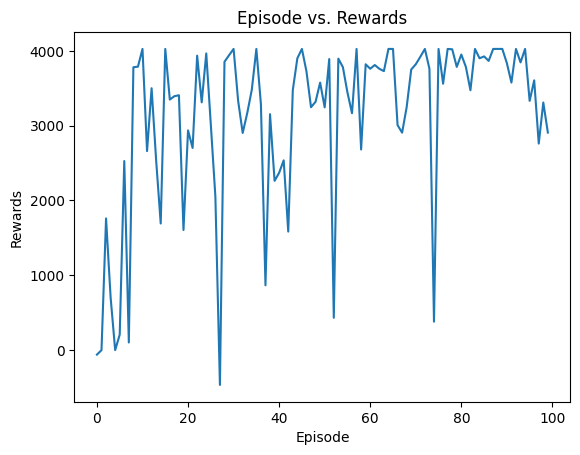

In [48]:
plt.plot(rewards_gamma4)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

## Epsilon values

In [ ]:
alpha = 0.2
gamma = 0.8
epsilon2 = 0.4
num_episodes = 50
epsilon_decay_rate = 0.01
agent_e2 = QLearningAgent(env, alpha, gamma, epsilon2, epsilon_decay_rate)
rewards_e2 = agent_e2.q_learning_train(num_episodes)

Step:  1  , Current state:  (0, 0) , Chosen action:  0 , State Reward 0  , Reward: 0
Step:  2  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  3  , Current state:  (0, 0) , Chosen action:  0 , State Reward 0  , Reward: 0
Step:  4  , Current state:  (0, 0) , Chosen action:  0 , State Reward 0  , Reward: 0
Step:  5  , Current state:  (0, 1) , Chosen action:  1 , State Reward 0  , Reward: 0
Step:  6  , Current state:  (0, 2) , Chosen action:  1 , State Reward -6  , Reward: -6
Step:  7  , Current state:  (0, 1) , Chosen action:  3 , State Reward 0  , Reward: -6
Step:  8  , Current state:  (1, 1) , Chosen action:  2 , State Reward 0  , Reward: -6
Step:  9  , Current state:  (2, 1) , Chosen action:  2 , State Reward 0  , Reward: -6
Step:  10  , Current state:  (1, 1) , Chosen action:  0 , State Reward 0  , Reward: -6
Step:  11  , Current state:  (1, 0) , Chosen action:  3 , State Reward -3  , Reward: -9
Step:  12  , Current state:  (0, 0) , Chosen action:  0

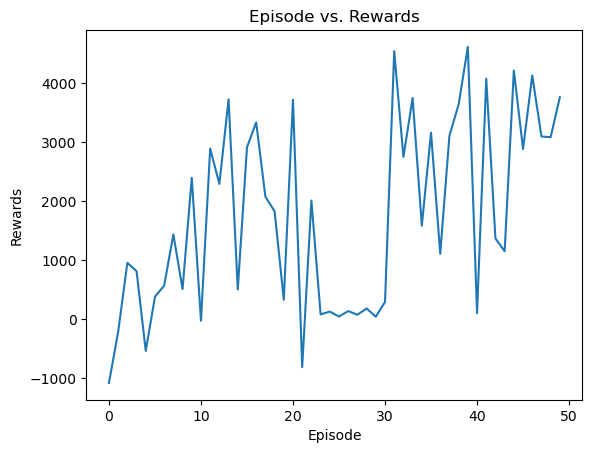

In [ ]:
plt.plot(rewards_e2)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

In [ ]:
epsilon3 = 0.7
agent_e3 = QLearningAgent(env, alpha, gamma, epsilon3, epsilon_decay_rate)
rewards_e3 = agent_e3.q_learning_train(num_episodes)

Step:  1  , Current state:  (0, 0) , Chosen action:  0 , State Reward 0  , Reward: 0
Step:  2  , Current state:  (0, 1) , Chosen action:  1 , State Reward 0  , Reward: 0
Step:  3  , Current state:  (0, 2) , Chosen action:  1 , State Reward -6  , Reward: -6
Step:  4  , Current state:  (0, 3) , Chosen action:  1 , State Reward 0  , Reward: -6
Step:  5  , Current state:  (0, 2) , Chosen action:  3 , State Reward -6  , Reward: -12
Step:  6  , Current state:  (0, 1) , Chosen action:  3 , State Reward 0  , Reward: -12
Step:  7  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: -12
Step:  8  , Current state:  (0, 0) , Chosen action:  0 , State Reward 0  , Reward: -12
Step:  9  , Current state:  (1, 0) , Chosen action:  2 , State Reward -3  , Reward: -15
Step:  10  , Current state:  (2, 0) , Chosen action:  2 , State Reward 0  , Reward: -15
Step:  11  , Current state:  (1, 0) , Chosen action:  0 , State Reward -3  , Reward: -18
Step:  12  , Current state:  (0, 0) , Chose

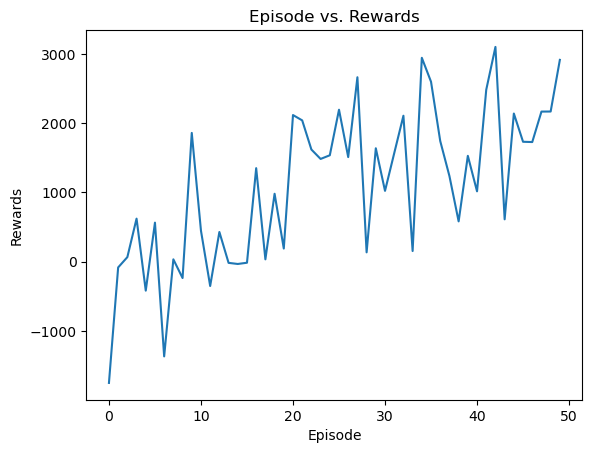

In [ ]:
plt.plot(rewards_e3)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

In [ ]:
epsilon4 = 0.6
agent_e4 = QLearningAgent(env, alpha, gamma, epsilon4, epsilon_decay_rate)
rewards_e4 = agent_e4.q_learning_train(num_episodes)

Step:  1  , Current state:  (0, 0) , Chosen action:  0 , State Reward 0  , Reward: 0
Step:  2  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  3  , Current state:  (0, 1) , Chosen action:  1 , State Reward 0  , Reward: 0
Step:  4  , Current state:  (0, 2) , Chosen action:  1 , State Reward -6  , Reward: -6
Step:  5  , Current state:  (0, 1) , Chosen action:  3 , State Reward 0  , Reward: -6
Step:  6  , Current state:  (0, 1) , Chosen action:  0 , State Reward 0  , Reward: -6
Step:  7  , Current state:  (0, 1) , Chosen action:  0 , State Reward 0  , Reward: -6
Step:  8  , Current state:  (0, 2) , Chosen action:  1 , State Reward -6  , Reward: -12
Step:  9  , Current state:  (0, 3) , Chosen action:  1 , State Reward 0  , Reward: -12
Step:  10  , Current state:  (1, 3) , Chosen action:  2 , State Reward 5  , Reward: -7
Step:  11  , Current state:  (2, 3) , Chosen action:  2 , State Reward 0  , Reward: -7
Step:  12  , Current state:  (2, 2) , Chosen action

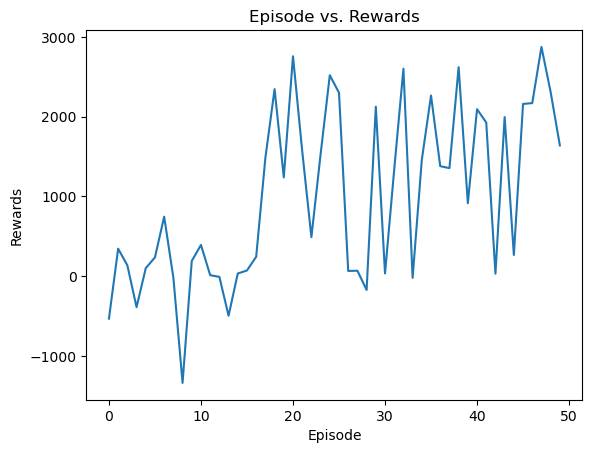

In [ ]:
plt.plot(rewards_e4)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

## Epsilon decay rate

In [ ]:
epsilon_decay_rate2 = 0.08
agent_ed2 = QLearningAgent(env, alpha, gamma, epsilon, epsilon_decay_rate2)
rewards_ed2 = agent_ed2.q_learning_train(num_episodes)

Step:  1  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  2  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  3  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  4  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  5  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  6  , Current state:  (0, 1) , Chosen action:  1 , State Reward 0  , Reward: 0
Step:  7  , Current state:  (1, 1) , Chosen action:  2 , State Reward 0  , Reward: 0
Step:  8  , Current state:  (1, 2) , Chosen action:  1 , State Reward 0  , Reward: 0
Step:  9  , Current state:  (0, 2) , Chosen action:  0 , State Reward -6  , Reward: -6
Step:  10  , Current state:  (1, 2) , Chosen action:  2 , State Reward 0  , Reward: -6
Step:  11  , Current state:  (1, 3) , Chosen action:  1 , State Reward 5  , Reward: -1
Step:  12  , Current state:  (1, 2) , Chosen action:  3 , S

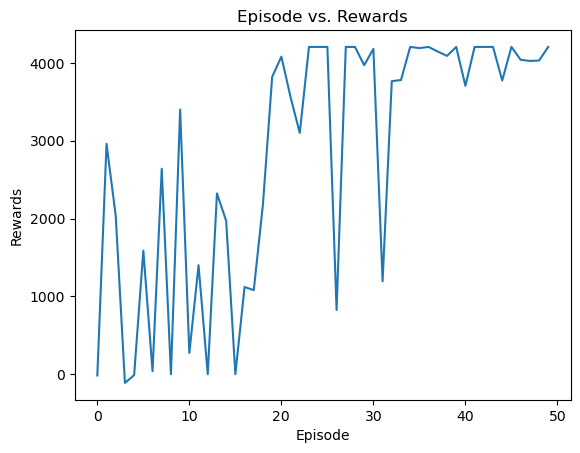

In [ ]:
plt.plot(rewards_ed2)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

In [ ]:
epsilon_decay_rate3 = 0.3
agent_ed3 = QLearningAgent(env, alpha, gamma, epsilon, epsilon_decay_rate3)
rewards_ed3 = agent_ed3.q_learning_train(num_episodes)

Step:  1  , Current state:  (1, 0) , Chosen action:  2 , State Reward -3  , Reward: -3
Step:  2  , Current state:  (1, 1) , Chosen action:  1 , State Reward 0  , Reward: -3
Step:  3  , Current state:  (2, 1) , Chosen action:  2 , State Reward 0  , Reward: -3
Step:  4  , Current state:  (1, 1) , Chosen action:  0 , State Reward 0  , Reward: -3
Step:  5  , Current state:  (1, 2) , Chosen action:  1 , State Reward 0  , Reward: -3
Step:  6  , Current state:  (1, 3) , Chosen action:  1 , State Reward 5  , Reward: 2
Step:  7  , Current state:  (0, 3) , Chosen action:  0 , State Reward 0  , Reward: 2
Step:  8  , Current state:  (0, 2) , Chosen action:  3 , State Reward -6  , Reward: -4
Step:  9  , Current state:  (1, 2) , Chosen action:  2 , State Reward 0  , Reward: -4
Step:  10  , Current state:  (1, 3) , Chosen action:  1 , State Reward 5  , Reward: 1
Step:  11  , Current state:  (0, 3) , Chosen action:  0 , State Reward 0  , Reward: 1
Step:  12  , Current state:  (0, 4) , Chosen action:  

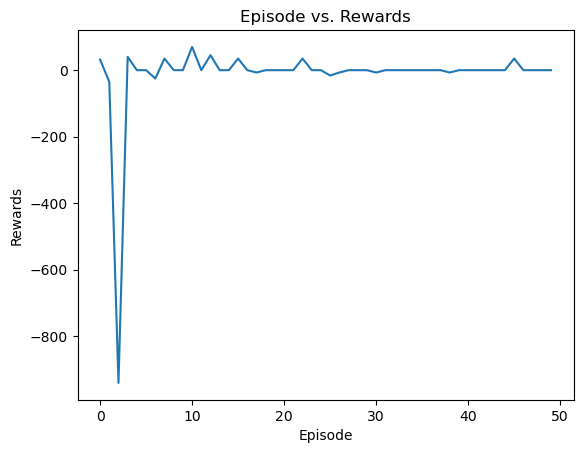

In [ ]:
plt.plot(rewards_ed3)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

In [ ]:
epsilon_decay_rate4 = 0.5
agent_ed4 = QLearningAgent(env, alpha, gamma, epsilon, epsilon_decay_rate4)
rewards_ed4 = agent_ed4.q_learning_train(num_episodes)

Step:  1  , Current state:  (0, 0) , Chosen action:  0 , State Reward 0  , Reward: 0
Step:  2  , Current state:  (0, 0) , Chosen action:  0 , State Reward 0  , Reward: 0
Step:  3  , Current state:  (0, 0) , Chosen action:  0 , State Reward 0  , Reward: 0
Step:  4  , Current state:  (0, 0) , Chosen action:  0 , State Reward 0  , Reward: 0
Step:  5  , Current state:  (0, 0) , Chosen action:  0 , State Reward 0  , Reward: 0
Step:  6  , Current state:  (0, 0) , Chosen action:  0 , State Reward 0  , Reward: 0
Step:  7  , Current state:  (0, 1) , Chosen action:  1 , State Reward 0  , Reward: 0
Step:  8  , Current state:  (1, 1) , Chosen action:  2 , State Reward 0  , Reward: 0
Step:  9  , Current state:  (1, 2) , Chosen action:  1 , State Reward 0  , Reward: 0
Step:  10  , Current state:  (0, 2) , Chosen action:  0 , State Reward -6  , Reward: -6
Step:  11  , Current state:  (0, 2) , Chosen action:  0 , State Reward 0  , Reward: -6
Step:  12  , Current state:  (1, 2) , Chosen action:  2 , St

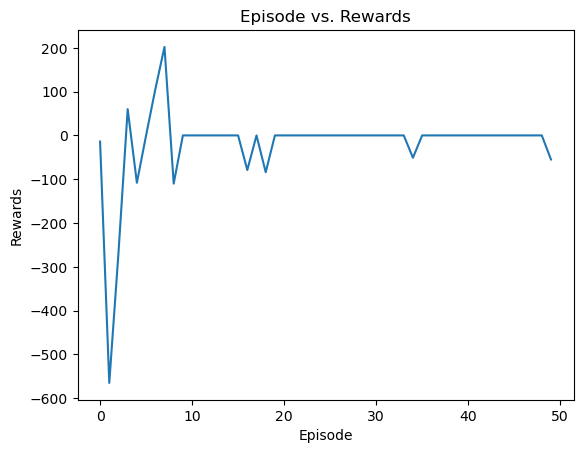

In [ ]:
plt.plot(rewards_ed4)
plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Episode vs. Rewards')
plt.show()

Epsilon decay Vs Rewards per episode

In [49]:
epsilon_decay_list = [0.9, 0.6, 0.3, 0.1, 0.05, 0.02]
final = []
for i in range(len(epsilon_decay_list)):
    agent_list= SarsaAgent(env, alpha, gamma, epsilon, epsilon_decay_list[i])
    rewards_list = agent_list.sarsa_train(num_episodes)
    final_reward = final.append(rewards_list)

Streaming output truncated to the last 5000 lines.
Step:  17  , Current state:  (0, 1) , Chosen action:  3 , State Reward 0  , Reward: -4
Step:  18  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: -4
Step:  19  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: -4
Step:  20  , Current state:  (0, 1) , Chosen action:  1 , State Reward 0  , Reward: -4
Step:  21  , Current state:  (1, 1) , Chosen action:  2 , State Reward 0  , Reward: -4
Step:  22  , Current state:  (1, 2) , Chosen action:  1 , State Reward 0  , Reward: -4
Step:  23  , Current state:  (1, 3) , Chosen action:  1 , State Reward 5  , Reward: 1
Step:  24  , Current state:  (1, 4) , Chosen action:  1 , State Reward 0  , Reward: 1
Step:  25  , Current state:  (2, 4) , Chosen action:  2 , State Reward 0  , Reward: 1
Step:  26  , Current state:  (3, 4) , Chosen action:  2 , State Reward 0  , Reward: 1
Step:  27  , Current state:  (2, 4) , Chosen action:  0 , State Reward 0  , Reward:

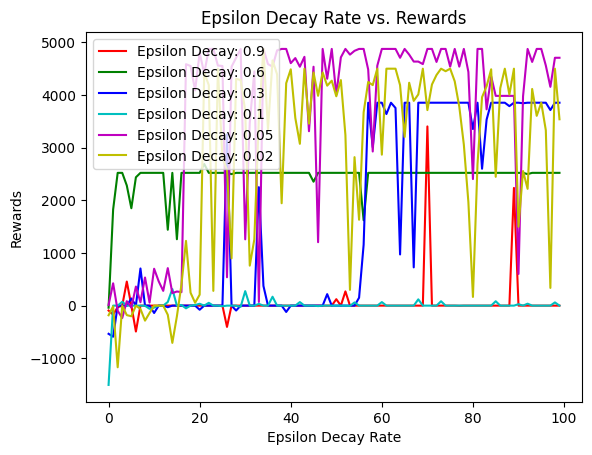

In [50]:
colors = ['r', 'g', 'b', 'c', 'm', 'y']
# Plot the rewards for each epsilon_decay value with different color lines
for i in range(len(epsilon_decay_list)):
    plt.plot(final[i], colors[i], label='Epsilon Decay: {}'.format(epsilon_decay_list[i]))

plt.xlabel('Epsilon Decay Rate')
plt.ylabel('Rewards')
plt.title('Epsilon Decay Rate vs. Rewards')
plt.legend()
plt.show()

# Bonus Task: 2-step bootstrapping SARSA

In [59]:
class Step2SarsaAgent:
  def __init__(self, env, alpha, gamma, epsilon, epsilon_decay_rate):
    self.env = env
    self.observation_space = env.observation_space
    self.action_space = env.action_space
    self.alpha = alpha
    self.gamma = gamma
    self.epsilon = epsilon
    self.epsilon_decay_rate = epsilon_decay_rate
    self.max_iteration = 200
    self.q_table = np.random.rand(self.observation_space.n, self.action_space.n)
    self.ind = {}
    z= 0
    for i in range(self.env.nrows): 
          for j in range(self.env.ncols):
            self.ind[(i,j)] = z
            z += 1
        

  def choose_action(self, state, episode):
    decayed_epsilon = self.epsilon * (1 / (1 + (self.epsilon_decay_rate * episode)))
    if np.random.uniform(0, 1) < decayed_epsilon:
      # choose random action
      return np.random.choice(self.action_space.n)
    else:
      # choose greedy action
      return np.argmax(self.q_table[self.ind[state], :])

  def sarsa_step(self, state, episode):
    action = self.choose_action(state, episode)
    next_state, timesteps, state_reward, reward, done, info = self.env.step(action)
    next_action = self.choose_action(next_state, episode)
    next_next_state, timesteps, state_reward, reward, done, info = self.env.step(next_action) #next to next lookup
    next_next_action = self.choose_action(next_next_state, episode)
    td_error = (reward + (self.gamma * self.q_table[self.ind[next_next_state], next_next_action])) - self.q_table[self.ind[state], action]
    self.q_table[self.ind[state], action] += self.alpha * td_error
    return next_state, action, state_reward, reward, done, info




  def step2_sarsa_train(self, num_episodes): 
    rewards = []
    for episode in range(num_episodes):
      # self.env.render()

      iterations = 0
      total_reward = 0
    
      state = self.env.reset()
      # print('state----' , state)
      while iterations < self.max_iteration :
        state, action, state_reward, reward, done, info = self.sarsa_step(state, episode)
        print("Step: ", iterations + 1, " , Current state: ", state, ", Chosen action: ", action, ", State Reward", state_reward , " , Reward:", reward)
        total_reward += reward
        iterations += 1
        if done:
          break
      print("*****************************************************************************************************************************************")
      rewards.append(total_reward)
    return rewards

In [65]:
env = GridWorldEnv()
alpha = 0.2
gamma = 0.88
epsilon = 0.1
num_episodes = 100
epsilon_decay_rate = 0.01
agent = SarsaAgent(env, alpha, gamma, epsilon, epsilon_decay_rate)
rewards = agent.sarsa_train(num_episodes)

Streaming output truncated to the last 5000 lines.
Step:  3  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  4  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  5  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  6  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  7  , Current state:  (0, 0) , Chosen action:  0 , State Reward 0  , Reward: 0
Step:  8  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  9  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  10  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  11  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  12  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  13  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  14 

In [66]:
env = GridWorldEnv()

step2_sarsa_agent = Step2SarsaAgent(env, alpha, gamma, epsilon, epsilon_decay_rate)
step2_sarsa_rewards = step2_sarsa_agent.step2_sarsa_train(num_episodes)

Step:  1  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  2  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  3  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  4  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  5  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  6  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  7  , Current state:  (0, 0) , Chosen action:  0 , State Reward 0  , Reward: 0
Step:  8  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  9  , Current state:  (0, 0) , Chosen action:  3 , State Reward 0  , Reward: 0
Step:  10  , Current state:  (0, 1) , Chosen action:  1 , State Reward 0  , Reward: 0
Step:  11  , Current state:  (2, 1) , Chosen action:  2 , State Reward 0  , Reward: 0
Step:  12  , Current state:  (2, 3) , Chosen action:  1 , State

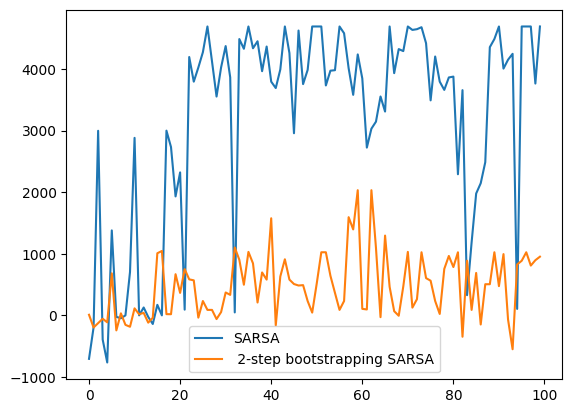

In [67]:
plt.plot(rewards, label= 'SARSA')
plt.plot(step2_sarsa_rewards, label= ' 2-step bootstrapping SARSA')


plt.legend()
plt.show()

# Contribution

In [68]:
print('Team Member 1: Drashti Thummar        :Part 1 : Step 1, 2,    Part 2 : Step 1, 2,   Part : 3 Step 3 + Bonus Contribution : 50%')
print('Team Member 2: Vaishali Jain          :Part 1 : Step 1, 2, 3, Part 2 : Step 3       Part 3 Step 1,2 + Bonus Contribution : 50%')

Team Member 1: Drashti Thummar        :Part 1 : Step 1, 2,    Part 2 : Step 1, 2,   Part : 3 Step 3 + Bonus Contribution : 50%
Team Member 2: Vaishali Jain          :Part 1 : Step 1, 2, 3, Part 2 : Step 3       Part 3 Step 1,2 + Bonus Contribution : 50%


# References

https://towardsdatascience.com/q-learning-algorithm-from-explanation-to-implementation-cdbeda2ea187

https://www.datacamp.com/tutorial/introduction-q-learning-beginner-tutorial

https://www.geeksforgeeks.org/q-learning-in-python/

https://towardsdatascience.com/q-learning-and-sasar-with-python-3775f86bd178

https://www.gymlibrary.dev/